100%|██████████| 170498071/170498071 [00:02<00:00, 60805517.62it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


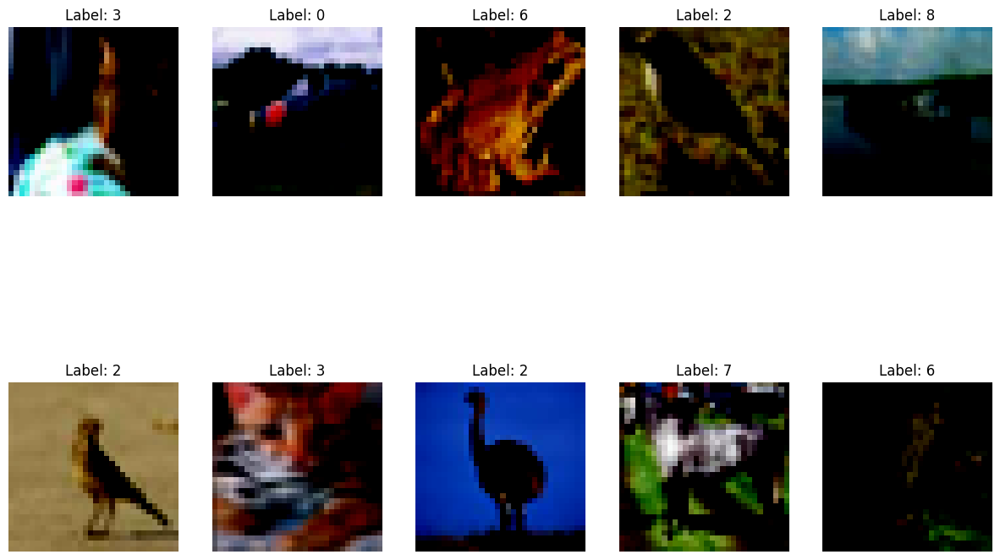

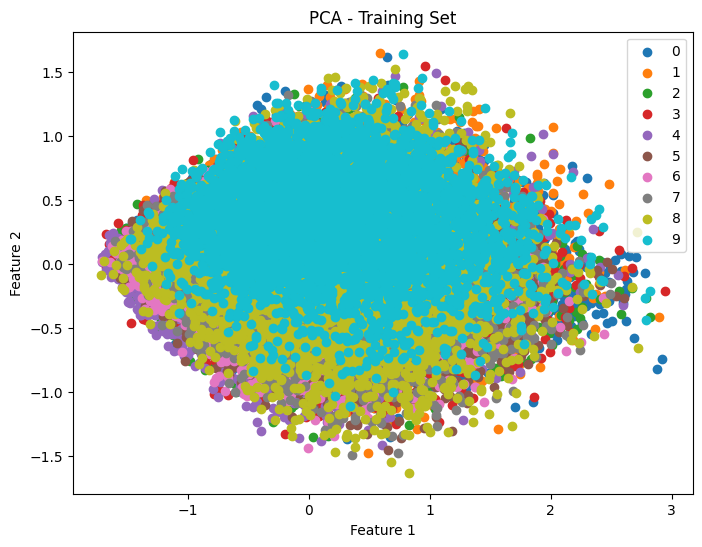

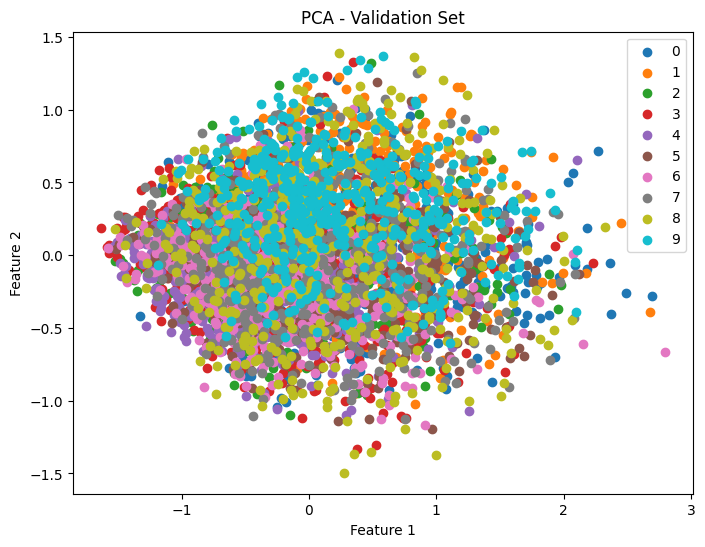

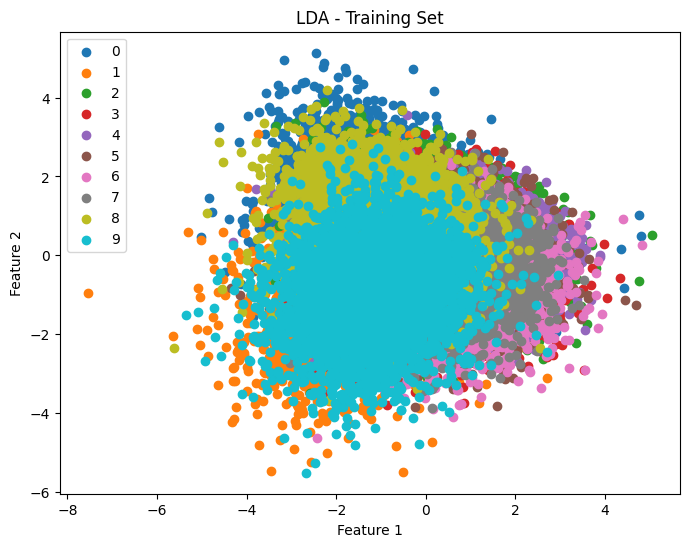

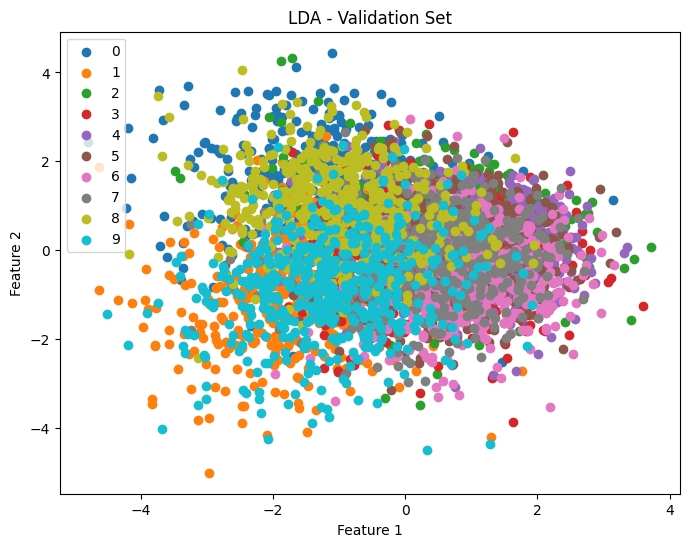

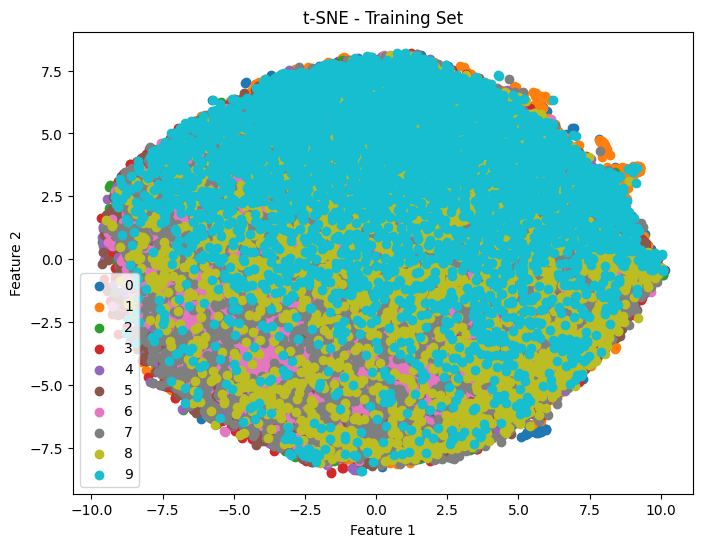

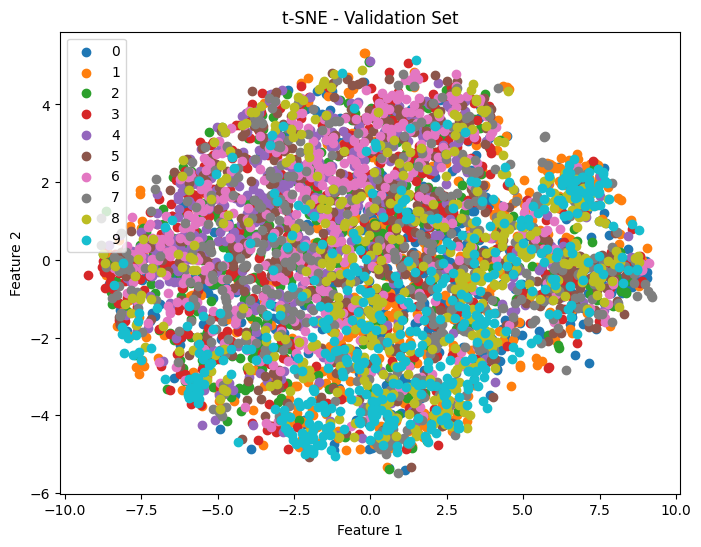

Epoch [1/25], Training Loss: 1178.3351, Validation Loss: 117.9192, Testing Loss: 231.1938, Training Accuracy: 38.96%, Validation Accuracy: 45.50%, Testing Accuracy: 46.33%
Epoch [2/25], Training Loss: 978.7896, Validation Loss: 104.0523, Testing Loss: 204.8270, Training Accuracy: 50.04%, Validation Accuracy: 53.26%, Testing Accuracy: 52.55%
Epoch [3/25], Training Loss: 895.2403, Validation Loss: 104.6417, Testing Loss: 204.6649, Training Accuracy: 54.60%, Validation Accuracy: 53.16%, Testing Accuracy: 53.74%
Epoch [4/25], Training Loss: 838.6534, Validation Loss: 95.4323, Testing Loss: 187.5115, Training Accuracy: 57.60%, Validation Accuracy: 56.88%, Testing Accuracy: 57.30%
Epoch [5/25], Training Loss: 792.9832, Validation Loss: 91.1857, Testing Loss: 177.9322, Training Accuracy: 60.10%, Validation Accuracy: 59.12%, Testing Accuracy: 59.47%
Epoch [6/25], Training Loss: 757.0054, Validation Loss: 90.9536, Testing Loss: 177.5368, Training Accuracy: 61.89%, Validation Accuracy: 59.44%, T

<IPython.core.display.Javascript object>

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# CNN LeNet
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(6, 16, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(16*5*5, 120),
            nn.ReLU()
        )
        self.fc2 = nn.Sequential(
            nn.Linear(120, 84),
            nn.ReLU()
        )
        self.classifier = nn.Linear(84, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = x.view(-1,16 * 5 * 5)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.classifier(x)
        return x


model = LeNet()

writer = SummaryWriter()

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load CIFAR-10 dataset
full_dataset = datasets.CIFAR10('./data', train=True, download=True, transform=transform)

# Split dataset into training set and validation set
train_size = int(0.9 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

# Test dataset and loader
test_dataset = datasets.CIFAR10('./data', train=False, download=True, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)



# Function to display images in a grid
def show_images(images, labels, ncols=5):
    nrows = len(images) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10))
    for i, ax in enumerate(axes.flat):
        ax.imshow(np.transpose(images[i], (1, 2, 0)))
        ax.set_title(f"Label: {labels[i]}")
        ax.axis('off')
    plt.show()

# Visualize some random examples from the training set
num_examples = 10
random_indices = np.random.choice(len(train_loader.dataset), num_examples, replace=False)
images = [train_loader.dataset[idx][0] for idx in random_indices]
labels = [train_loader.dataset[idx][1] for idx in random_indices]

show_images(images, labels)

def extract_features(loader):
    features = []
    labels = []
    for data, target in loader:
        output = model.conv2(model.conv1(data))
        features.append(output.view(output.size(0), -1).detach().numpy())
        labels.append(target.numpy())
    return np.concatenate(features), np.concatenate(labels)

train_features, train_labels = extract_features(train_loader)
val_features, val_labels = extract_features(val_loader)
# PCA
pca = PCA(n_components=2)
train_pca = pca.fit_transform(train_features)
val_pca = pca.transform(val_features)

# LDA
lda = LDA(n_components=2)
train_lda = lda.fit_transform(train_features, train_labels)
val_lda = lda.transform(val_features)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
train_tsne = tsne.fit_transform(train_features)
val_tsne = tsne.fit_transform(val_features)

# Plotting
def plot_features(features, labels, title):
    plt.figure(figsize=(8, 6))
    for i in range(10):
        plt.scatter(features[labels == i, 0], features[labels == i, 1], label=str(i))
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

plot_features(train_pca, train_labels, 'PCA - Training Set')
plot_features(val_pca, val_labels, 'PCA - Validation Set')

plot_features(train_lda, train_labels, 'LDA - Training Set')
plot_features(val_lda, val_labels, 'LDA - Validation Set')

plot_features(train_tsne, train_labels, 't-SNE - Training Set')
plot_features(val_tsne, val_labels, 't-SNE - Validation Set')




#epochs
epochs=25
for epoch in range(epochs):
    epoch_loss = 0.0
    correct = 0
    total = 0
    for batch_idx, (data, target) in enumerate(train_loader):
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

    train_accuracy = 100 * correct / total
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    for data, target in val_loader:
        output = model(data)
        loss = criterion(output, target)
        val_loss += loss.item()
        _, predicted = output.max(1)
        val_total += target.size(0)
        val_correct += predicted.eq(target).sum().item()

    val_accuracy = 100 * val_correct / val_total

    writer.add_scalar('Loss/train', epoch_loss, epoch)
    writer.add_scalar('Loss/validation', val_loss, epoch)
    writer.add_scalar('Accuracy/train', train_accuracy, epoch)
    writer.add_scalar('Accuracy/validation', val_accuracy, epoch)
    test_loss = 0.0
    test_correct = 0
    test_total = 0
    for data, target in test_loader:
        output = model(data)
        loss = criterion(output, target)
        test_loss += loss.item()
        _, predicted = output.max(1)
        test_total += target.size(0)
        test_correct += predicted.eq(target).sum().item()

    test_accuracy = 100 * test_correct / test_total
    writer.add_scalar('Loss/test', test_loss, epoch)
    writer.add_scalar('Accuracy/test', test_accuracy, epoch)

    print(f'Epoch [{epoch + 1}/{epochs}], Training Loss: {epoch_loss:.4f}, Validation Loss: {val_loss:.4f}, Testing Loss: {test_loss:.4f}, Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%, Testing Accuracy: {test_accuracy:.2f}%')


def preprocess_image(image):
    image = transforms.Normalize((0.5,), (0.5,))(image)
    return image.unsqueeze(0)  # Add batch dimension

model.eval()
predictions = []
true_labels = []
with torch.no_grad():
    for data, target in test_loader:
        for image in data:
            preprocessed_image = preprocess_image(image)
            output = model(preprocessed_image)
            predictions.extend(output.argmax(dim=1).tolist())
        true_labels.extend(target.tolist())

#display data
conf_matrix = confusion_matrix(true_labels, predictions)
classification_rep = classification_report(true_labels, predictions)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", classification_rep)
writer.close()
%reload_ext tensorboard
%tensorboard --logdir=runs






